# 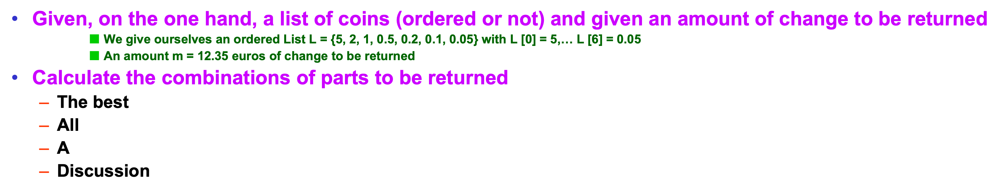

In [6]:
#The best solution
import datetime

def make_changes(L,m): 
    i = 0;
    data = {}
    while(m !=0 and i < len(L)):
      coinExchange = int(round(m,2)/L[i])
      if(coinExchange !=0):
        key = L[i] 
        data[key] =  coinExchange
      m = m - round(coinExchange*L[i],i)
      i +=1
    return data

coinList = [5, 2, 1, 0.5, 0.2, 0.1, 0.05]
note = 12.35
start_time = datetime.datetime.now()
exchanges = make_changes(coinList,note)
print(exchanges)
end_time = datetime.datetime.now()
e = 0
for key in exchanges:
  e += float(key*exchanges[key])
  #print(e)


if note != e:
    #print(round(note-e,7))
    print("I cannot exchange your money: ",round(note-e,7))

print("Total Time needed to execute: " + str((end_time-start_time).microseconds)+" microseconds.")

{5: 2, 2: 1, 0.2: 1, 0.1: 1, 0.05: 1}
Total Time needed to execute: 344 microseconds.


# All the solution
Recursive

In [ ]:
# It is taking more memories during execution. I think it's not optimal solution
import datetime

def count(L, m):

    L = [int(i*100) for i in L]
    m = int(m *100)

    T = [0] * (m + 1)
    T[0] = 1
    for i in range(len(L)):
        j = L[i]
        while j <= m:
            T[j] += T[j - L[i]]
            j = j + 1
        
    return T[m]

def find_all_changes(n, coins):

    if n < 0:
        return []
    if n == 0:
         return [[]]
    all_changes = []

    for last_used_coin in coins:
        recursive_call = find_all_changes(n - last_used_coin, coins)
        for recall in recursive_call:
            recall.append(last_used_coin)
            all_changes.append(recall)

    return all_changes

def calculatingAllpathsWithTime(coinList,note):

    coinList = [int(i*100) for i in coinList]
    note = int(note *100)
    start_time = datetime.datetime.now()
    all_path = find_all_changes(note,coinList);
    totalWays = count(coinList,note);
    data = {}
    dataFinal = {}
    countI = []
    dataN = {}
    uniqueArr = []
    if len(all_path) > 0:
      for i in range(0,len(all_path)):
        key = i + 1
        data[key] = all_path[i]


      for k, v in data.items():
        sortedArr = sorted(v)
        #print(sortedArr)
        countI.append(sortedArr)
        
      
      n = set(map(tuple, countI))
      dataFinal = list(n)
      
      for t in range(0,len(dataFinal)):
        key = t + 1
        dataN[key] = list(dataFinal[t])

      
      for k, v in dataN.items():
        my_dict = {i/100:v.count(i) for i in v}
        print(my_dict)
       
      end_time = datetime.datetime.now()     

      print("Total number of ways to make change of " + str(note/100) + " is :" + str(totalWays));
      print("Total Time needed to execute: " + str((end_time-start_time).microseconds)+" microseconds.")
    else:
      print("Sorry, Exchange not possible!")

coinList = [5, 2, 1, 0.5, 0.2, 0.1, 0.05]
note = 12.35

#call the function to calculate and return the all possible exchanges

calculatingAllpathsWithTime(coinList,note)

In [15]:
'''The main idea is: 
    1. start with minimal denomination.
    2. If you have enough money, you are done, collect this result.
    3. Else for all denominations, add a coin to each existing sequence.
    4. If sum of the sequence is greater than your goal, discard that sequence.
    5. Else, go to 1.
    6. Repeat until there are no sequences left which are less than your goal.'''

'The main idea is: \n    1. start with minimal denomination.\n    2. If you have enough money, you are done, collect this result.\n    3. Else for all denominations, add a coin to each existing sequence.\n    4. If sum of the sequence is greater than your goal, discard that sequence.\n    5. Else, go to 1.\n    6. Repeat until there are no sequences left which are less than your goal.'

# Iterative Solution

In [20]:
def count(L, m):

    L = [int(i*100) for i in L]
    m = int(m *100)

    T = [0] * (m + 1)
    T[0] = 1
    for i in range(len(L)):
        j = L[i]
        while j <= m:
            T[j] += T[j - L[i]]
            j = j + 1
        
    return T[m]

def best_solution(L,m): 
    i = 0;
    data = {}
    while(m !=0 and i < len(L)):
      coinExchange = int(round(m,2)/L[i])
      if(coinExchange !=0):
        key = L[i] 
        data[key] =  coinExchange
      m = m - round(coinExchange*L[i],i)
      i +=1
    return data



def make_change(goal, coins):
    coins = [int(i*100) for i in coins]
    goal = int(goal *100)
    wallets = [[coin] for coin in coins]
    new_wallets = []
    collected = []
    data = {}

    while wallets:
        for wallet in wallets:
            s = sum(wallet)
            for coin in coins:
                if coin >= wallet[-1]:
                    if s + coin < goal:
                        new_wallets.append(wallet + [coin])
                    elif s + coin == goal:
                        collected.append(wallet + [coin])
        wallets = new_wallets
        new_wallets = []

    for t in range(0,len(collected)):
        key = t + 1
        data[key] = list(collected[t])


    return data

start_time = datetime.datetime.now()
coinList = [5, 2, 1, 0.5, 0.2, 0.1, 0.05]
note = 12.35

result = make_change(note,coinList)

for k, v in result.items():
  my_dict = {i/100:v.count(i) for i in v}
  print(my_dict)

best_solution = best_solution(coinList,note)

    
totalWays = count(coinList,note);
#print("Number of ways: ", str(totalWays))
end_time = datetime.datetime.now()     
print("Best Solution is :");
print(best_solution)
print("Total number of ways to make change of " + str(note) + " is :" + str(totalWays-1));
print("Total Time needed to execute: " + str((end_time-start_time).microseconds)+" microseconds.")

{0.05: 1, 0.1: 1, 0.2: 1, 2.0: 1, 5.0: 2}
{0.05: 1, 0.1: 1, 0.2: 1, 1.0: 2, 5.0: 2}
{0.05: 1, 0.1: 3, 2.0: 1, 5.0: 2}
{0.05: 3, 0.2: 1, 2.0: 1, 5.0: 2}
{0.05: 1, 0.1: 1, 0.2: 1, 1.0: 1, 2.0: 3, 5.0: 1}
{0.05: 1, 0.1: 1, 0.2: 1, 0.5: 2, 1.0: 1, 5.0: 2}
{0.05: 1, 0.1: 3, 1.0: 2, 5.0: 2}
{0.05: 3, 0.2: 1, 1.0: 2, 5.0: 2}
{0.05: 3, 0.1: 2, 2.0: 1, 5.0: 2}
{0.05: 1, 0.2: 4, 0.5: 1, 1.0: 1, 5.0: 2}
{0.05: 1, 0.1: 1, 0.2: 1, 2.0: 6}
{0.05: 1, 0.1: 1, 0.2: 1, 1.0: 3, 2.0: 2, 5.0: 1}
{0.05: 1, 0.1: 1, 0.2: 1, 0.5: 2, 2.0: 3, 5.0: 1}
{0.05: 1, 0.1: 1, 0.2: 1, 0.5: 4, 5.0: 2}
{0.05: 1, 0.1: 3, 1.0: 1, 2.0: 3, 5.0: 1}
{0.05: 1, 0.1: 3, 0.5: 2, 1.0: 1, 5.0: 2}
{0.05: 3, 0.2: 1, 1.0: 1, 2.0: 3, 5.0: 1}
{0.05: 3, 0.2: 1, 0.5: 2, 1.0: 1, 5.0: 2}
{0.05: 3, 0.1: 2, 1.0: 2, 5.0: 2}
{0.05: 5, 0.1: 1, 2.0: 1, 5.0: 2}
{0.05: 1, 0.2: 4, 0.5: 1, 2.0: 3, 5.0: 1}
{0.05: 1, 0.2: 4, 0.5: 3, 5.0: 2}
{0.05: 1, 0.1: 1, 0.2: 1, 1.0: 2, 2.0: 5}
{0.05: 1, 0.1: 1, 0.2: 1, 1.0: 5, 2.0: 1, 5.0: 1}
{0.05: 1, 0.1: 1, 0.2: 1

In [4]:
#BOGDAN Recursive
coinList = [500, 200, 100, 50, 20, 10, 5]
note = 1235

def get_exchange(note):
  for i in range(len(coinList)):
    if note%coinList[i]==0:
      print(":",note//coinList[i],"times",coinList[i])
    elif note>=coinList[i]:
      rest = note-(note//coinList[i])*coinList[i]
      print("::",note//coinList[i],"times",coinList[i])
      if rest!=0:
        print("exchanging your rest:", rest)
        get_exchange(rest)

get_exchange(note)

:: 2 times 500
exchanging your rest: 235
:: 1 times 200
exchanging your rest: 35
:: 1 times 20
exchanging your rest: 15
:: 1 times 10
exchanging your rest: 5
: 1 times 5
: 3 times 5
:: 3 times 10
exchanging your rest: 5
: 1 times 5
: 7 times 5
:: 2 times 100
exchanging your rest: 35
:: 1 times 20
exchanging your rest: 15
:: 1 times 10
exchanging your rest: 5
: 1 times 5
: 3 times 5
:: 3 times 10
exchanging your rest: 5
: 1 times 5
: 7 times 5
:: 4 times 50
exchanging your rest: 35
:: 1 times 20
exchanging your rest: 15
:: 1 times 10
exchanging your rest: 5
: 1 times 5
: 3 times 5
:: 3 times 10
exchanging your rest: 5
: 1 times 5
: 7 times 5
:: 11 times 20
exchanging your rest: 15
:: 1 times 10
exchanging your rest: 5
: 1 times 5
: 3 times 5
:: 23 times 10
exchanging your rest: 5
: 1 times 5
: 47 times 5
:: 6 times 200
exchanging your rest: 35
:: 1 times 20
exchanging your rest: 15
:: 1 times 10
exchanging your rest: 5
: 1 times 5
: 3 times 5
:: 3 times 10
exchanging your rest: 5
: 1 ti

# 8 Queens Exercises

In [4]:
import copy

def take_input():
    """Accepts the size of the chess board"""

    while True:
        try:
            size = int(input('What is the size of the chessboard? n = \n'))
            if size == 1:
                print("Trivial solution, choose a board size of atleast 4")
            if size <= 3:
                print("Enter a value such that size>=4")
                continue
            return size
        except ValueError:
            print("Invalid value entered. Enter again")

def get_board(size):
    """Returns an n by n board"""
    board = [0]*size
    for ix in range(size):
        board[ix] = [0]*size
    return board

def print_solutions(solutions, size):
    """Prints all the solutions in user friendly way"""
    for sol in solutions:
        for row in sol:
            print(row)
        print()

def is_safe(board, row, col, size):
    """Check if it's safe to place a queen at board[x][y]"""

    #check row on left side
    for iy in range(col):
        if board[row][iy] == 1:
            return False

    ix, iy = row, col
    while ix >= 0 and iy >= 0:
        if board[ix][iy] == 1:
            return False
        ix-=1
        iy-=1

    jx, jy = row,col
    while jx < size and jy >= 0:
        if board[jx][jy] == 1:
            return False
        jx+=1
        jy-=1

    return True

def solve(board, col, size):
    """Use backtracking to find all solutions"""
    #base case
    if col >= size:
        return

    for i in range(size):
        if is_safe(board, i, col, size):
            board[i][col] = 1
            if col == size-1:
                add_solution(board)
                board[i][col] = 0
                return
            solve(board, col+1, size)
            #backtrack
            board[i][col] = 0

def add_solution(board):
    """Saves the board state to the global variable 'solutions'"""
    global solutions
    saved_board = copy.deepcopy(board)
    solutions.append(saved_board)

size = take_input()

board = get_board(size)

solutions = []

solve(board, 0, size)

print_solutions(solutions, size)

print("Total solutions = {}".format(len(solutions)))

What is the size of the chessboard? n = 
4
[0, 0, 1, 0]
[1, 0, 0, 0]
[0, 0, 0, 1]
[0, 1, 0, 0]

[0, 1, 0, 0]
[0, 0, 0, 1]
[1, 0, 0, 0]
[0, 0, 1, 0]

Total solutions = 2
